In [1]:
import __init__

In [2]:
import cv2
import os
import time
import matplotlib.pyplot as plt
import torch
import openvino as ov

In [3]:
ls ..\..\model_weights\

The system cannot find the file specified.


# detector

In [4]:
from faceapi.faceDetector.detector import OpenvinoDetector

In [5]:
core = ov.Core()
core.available_devices

['CPU', 'GPU.0', 'GPU.1']

In [6]:
face_dector = OpenvinoDetector(model_path= r"..\..\model_weights\face-yolov8-m_openvino_model\face-yolov8-m.xml", device='GPU.0')

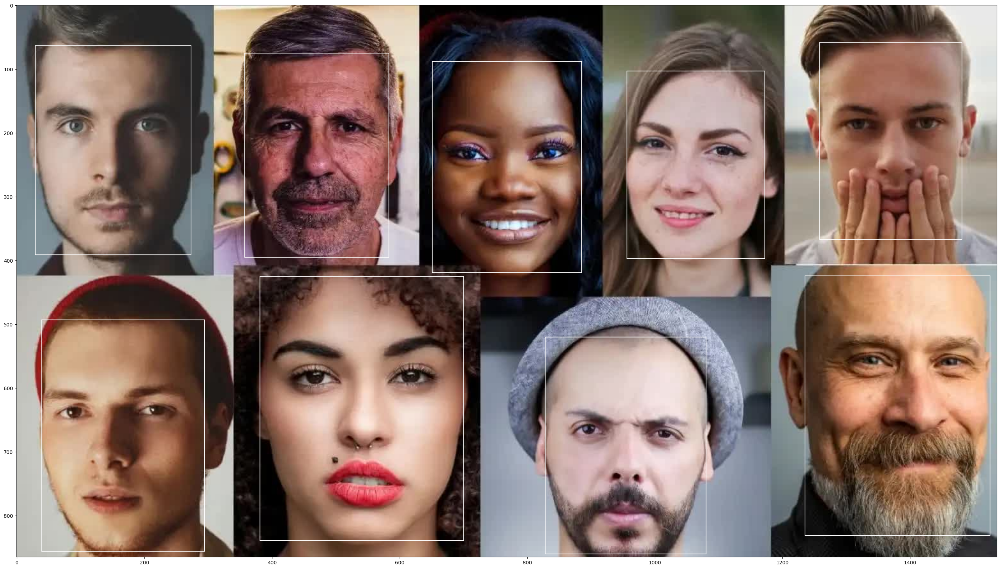

In [7]:
# img_file = r'C:/Users/jeffg/face-project/Pytorch_Retinaface/data/FDDB/images/2002/12/10/big/img_410.jpg'
# img_file = r'C:\Users\jeffg\ai-data\face-database\classify - 複製\9\64fc0389b6db50bc1f756e0e-166-4154.png'
img_file = r'..\..\data\test.jpg'
# img_file = r'C:/Users/jeffg/Desktop/test.jpg'

img = cv2.imread(img_file, cv2.IMREAD_COLOR)#[..., ::-1]
display_img = img.copy()
faces = face_dector.handle(img)
for face in faces:
    x1,y1,x2,y2  = face.xyxy  
    cv2.rectangle(display_img, ( x1,y1), (x2,y2), (255, 255, 255))
    
#embeddings = face_embedder.handle(face_img_list)
plt.figure(figsize=(40,20))
plt.imshow(display_img[..., ::-1])

# age

In [8]:
from faceapi.faceAge.detector import UTKfaceAgeOpenvinoDetector

In [9]:
face_age_dector = UTKfaceAgeOpenvinoDetector(model_path= r"..\..\model_weights\face_age_openvino_model\face_age_resnet18.xml", device='GPU.0')

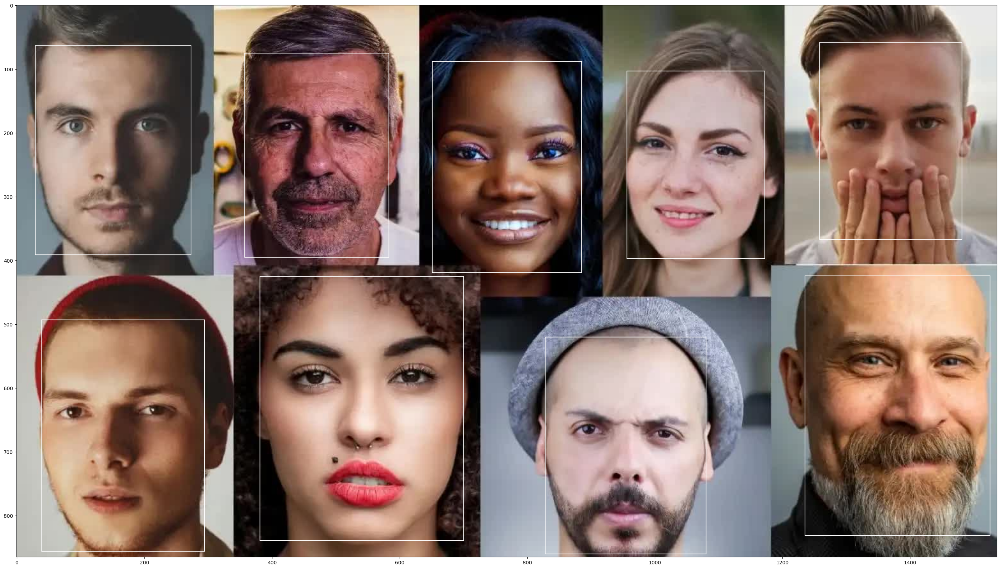

In [10]:
# img_file = r'C:/Users/jeffg/face-project/Pytorch_Retinaface/data/FDDB/images/2002/12/10/big/img_410.jpg'
# img_file = r'C:\Users\jeffg\ai-data\face-database\classify - 複製\9\64fc0389b6db50bc1f756e0e-166-4154.png'
img_file = r'..\..\data\test.jpg'
# img_file = r'C:/Users/jeffg/Desktop/test.jpg'

img = cv2.imread(img_file, cv2.IMREAD_COLOR)#[..., ::-1]
display_img = img.copy()
faces = face_dector.handle(img)
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
rgb_face_img_list = []
face_img_list = []
for face in faces:
    x1,y1,x2,y2  = face.xyxy

    face_img_list.append(img[y1:y2,x1:x2,:])
    rgb_face_img_list.append(rgb_img[y1:y2,x1:x2,:])

    
    cv2.rectangle(display_img, ( x1,y1), (x2,y2), (255, 255, 255))
    
#embeddings = face_embedder.handle(face_img_list)
plt.figure(figsize=(40,20))
plt.imshow(display_img[..., ::-1])

In [11]:
face_age_dector.handle(rgb_face_img_list)

array(['age: 35 ~ 40', 'age: 70 ~ 75', 'age: 35 ~ 40', 'age: 35 ~ 40', 'age: 35 ~ 40', 'age: 50 ~ 55', 'age: 35 ~ 40', 'age: 75 ~ 80', 'age: 30 ~ 35'], dtype='<U12')

# emotion

In [12]:
ls ..\..\model_weights\face_emotion_openvino_model

 磁碟區 C 中的磁碟是 Windows
 磁碟區序號:  9616-4CEB

 C:\Users\jeffg\face-project\face-api\model_weights\face_emotion_openvino_model 的目錄

2024/06/05  下午 08:44    <DIR>          .
2024/06/05  下午 08:55    <DIR>          ..
2024/06/05  下午 08:44        22,350,674 face_emotion_resnet18.bin
2024/06/05  下午 08:44            93,270 face_emotion_resnet18.xml
               2 個檔案      22,443,944 位元組
               2 個目錄  209,484,517,376 位元組可用


In [13]:
from faceapi.faceEmotion.detector import RafEmotionOpenvinoDetector

In [14]:
face_emotion_dector = RafEmotionOpenvinoDetector(model_path= r"..\..\model_weights\face_emotion_openvino_model\face_emotion_resnet18.xml", device='GPU.0')

In [15]:
face_emotion_dector.handle(rgb_face_img_list)

array(['Neutral', 'Happiness', 'Neutral', 'Happiness', 'Happiness', 'Neutral', 'Happiness', 'Happiness', 'Happiness'], dtype='<U9')

# gender

In [16]:
ls ..\..\model_weights\face_gender_openvino_model

 磁碟區 C 中的磁碟是 Windows
 磁碟區序號:  9616-4CEB

 C:\Users\jeffg\face-project\face-api\model_weights\face_gender_openvino_model 的目錄

2024/06/05  下午 08:55    <DIR>          .
2024/06/05  下午 08:55    <DIR>          ..
2024/06/05  下午 08:55        22,345,544 face_gender_resnet18.bin
2024/06/05  下午 08:55            93,270 face_gender_resnet18.xml
               2 個檔案      22,438,814 位元組
               2 個目錄  209,484,320,768 位元組可用


In [17]:
from faceapi.faceGender.detector import UTKfaceGenderOpenvinoDetector

In [18]:
face_gender_dector = UTKfaceGenderOpenvinoDetector(model_path= r"..\..\model_weights\face_gender_openvino_model\face_gender_resnet18.xml", device='GPU.0')

In [19]:
face_gender_dector.handle(rgb_face_img_list)

array(['female', 'male', 'male', 'female', 'male', 'male', 'female', 'male', 'male'], dtype='<U6')

In [3]:
from faceapi import OpenvinoFaceAPIManager

In [4]:
core = ov.Core()
core.available_devices

['CPU', 'GPU']

In [5]:
ls ..\..\

 Volume in drive C has no label.
 Volume Serial Number is 3625-3CE2

 Directory of C:\Users\mycena\face-api

06/05/2024  07:15 AM    <DIR>          .
06/05/2024  07:15 AM    <DIR>          ..
06/05/2024  02:01 AM                63 .gitignore
06/05/2024  07:20 AM    <DIR>          faceapi
06/05/2024  07:26 AM    <DIR>          jupyter
06/05/2024  07:18 AM    <DIR>          model
06/05/2024  02:01 AM             1,141 README.md
06/05/2024  02:01 AM                59 requirements.txt
               3 File(s)          1,263 bytes
               5 Dir(s)     714,137,600 bytes free


In [6]:
face_api_manager = OpenvinoFaceAPIManager(
    detector_model_path= r"..\..\model\face-yolov8-m_openvino_model\face-yolov8-m.xml",
    # encoder_model_path=r'C:\Users\jeffg\face-project\face-api\model_weights\feifei_face.pt',
    emotion_model_path= r"..\..\model\face_emotion_openvino_model\face_emotion_resnet18.xml", 
    age_model_path =   r"..\..\model\face_age_openvino_model\face_age_resnet18.xml", 
    gender_model_path = r"..\..\model\face_gender_openvino_model\face_gender_resnet18.xml", 

    device= 'GPU'
)

# reid_encoder = FastReIDInterface(
#     r'..\package\botsort\fast_reid\configs\MOT17\sbs_S50.yml', 
#     r'..\package\botsort\reid_model\mot17_sbs_S50.pth', 
#     face_api_manager._encoder._devie
# )

In [7]:
ls ..

 Volume in drive C has no label.
 Volume Serial Number is 3625-3CE2

 Directory of C:\Users\mycena\face-api\jupyter

06/05/2024  07:26 AM    <DIR>          .
06/05/2024  07:26 AM    <DIR>          ..
06/05/2024  07:24 AM    <DIR>          .ipynb_checkpoints
06/05/2024  02:01 AM               493 __init__.py
06/05/2024  02:01 AM    <DIR>          dataset
06/05/2024  02:01 AM           246,212 face-api-finetune.ipynb
06/05/2024  07:26 AM         4,351,639 face-api????.ipynb
06/05/2024  07:52 PM    <DIR>          openvino
06/05/2024  07:23 AM            84,944 test.jpg
               4 File(s)      4,683,288 bytes
               5 Dir(s)     714,219,520 bytes free


1.2010247707366943

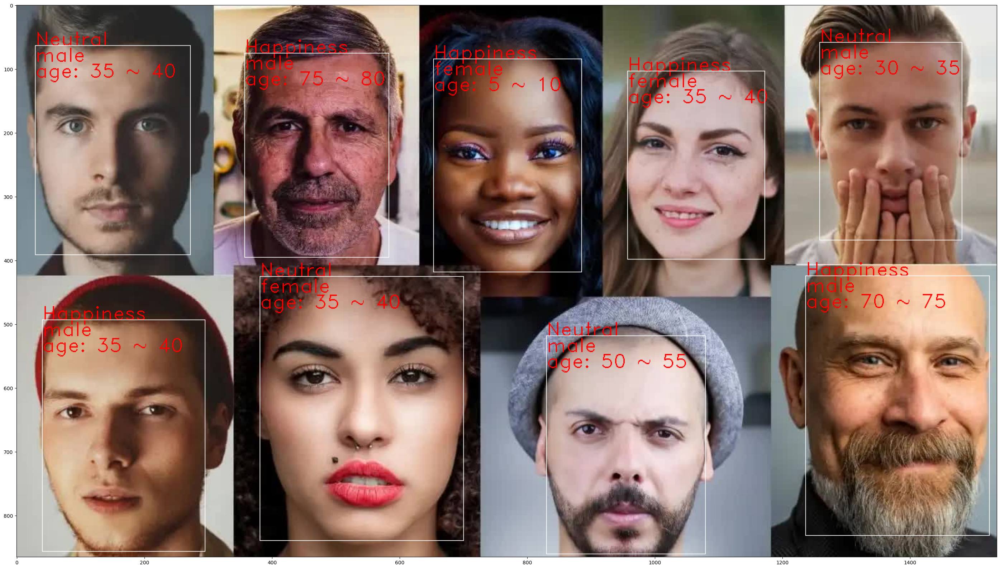

In [8]:
# img_file = r'C:/Users/jeffg/face-project/Pytorch_Retinaface/data/FDDB/images/2002/12/10/big/img_410.jpg'
# img_file = r'C:\Users\jeffg\ai-data\face-database\classify - 複製\9\64fc0389b6db50bc1f756e0e-166-4154.png'
img_file = r'..\test.jpg'
# img_file = r'C:/Users/jeffg/Desktop/test.jpg'


img = cv2.imread(img_file, cv2.IMREAD_COLOR)#[..., ::-1]
display_img = img.copy()


st = time.time()
faces = face_api_manager.handle(img, conf=0.5)
for face in faces:
    if len(face.embedding)>0:
        pred_idx = face.embedding.argmax()
        pred_prob = face.embedding[pred_idx]
        print({
           v: k
           for k , v in face_api_manager._encoder.class_to_idx.items()
        }[pred_idx], pred_prob)
    
    x1,y1,x2,y2  = face.xyxy  
    #reid = reid_encoder.inference(img, np.array(face.xyxy)[None]).ravel()
    cv2.putText(display_img, f"%s"%(face.emotion), (x1, y1),
                cv2.FONT_HERSHEY_DUPLEX, 1, (0, 0, 255))
    cv2.putText(display_img, f"%s"%(face.gender), (x1, y1 + 25),
                cv2.FONT_HERSHEY_DUPLEX, 1, (0, 0, 255))
    cv2.putText(display_img, f"%s"%(face.age), (x1, y1 + 50),
                cv2.FONT_HERSHEY_DUPLEX, 1, (0, 0, 255))
    cv2.rectangle(display_img, ( x1,y1), (x2,y2), (255, 255, 255))
    
#embeddings = face_embedder.handle(face_img_list)
plt.figure(figsize=(40,20))
plt.imshow(display_img[..., ::-1])
cost = time.time() -st
cost

In [9]:
cap = cv2.VideoCapture(0)

In [ ]:
while 1:
    d, frame = cap.read()
    if not d:
        print('no image')
        break

    display_frame = frame.copy()
    faces = face_api_manager.handle(frame, conf=0.3)
    for face in faces:
        label = "None"
        pred_prob = 0.0
        if len(face.embedding)>0:
            pred_idx = face.embedding.argmax()
            # 如果爆掉，很大原因是因為不是finetune model
            pred_prob = face.embedding[pred_idx]
            label = {
               v: k
               for k , v in face_api_manager._encoder.class_to_idx.items()
            }[pred_idx]
            #print(label, pred_prob)
        
        x1,y1,x2,y2  = face.xyxy  
        #reid = reid_encoder.inference(img, np.array(face.xyxy)[None]).ravel()
        cv2.putText(display_frame, f"%s"%(face.emotion), (x1, y1),
                    cv2.FONT_HERSHEY_DUPLEX, 1, (0, 0, 255))
        cv2.putText(display_frame, f"%s"%(face.gender), (x1, y1 + 25),
                    cv2.FONT_HERSHEY_DUPLEX, 1, (0, 0, 255))
        cv2.putText(display_frame, f"%s"%(face.age), (x1, y1 + 50),
                    cv2.FONT_HERSHEY_DUPLEX, 1, (0, 0, 255))
        cv2.rectangle(display_frame, ( x1,y1), (x2,y2), (255, 255, 255))
        
    cv2.imshow("camera", display_frame)

    
    key = cv2.waitKey(1) & 0xFF
    
    if key == ord('q'):  # q to quit
        print('Quit')
        break
        
cv2.destroyAllWindows()
cap.release()

In [ ]:
faces